In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture
from sklearn.cluster import AgglomerativeClustering, DBSCAN
from sklearn.manifold import TSNE

from scipy.spatial.distance import pdist, squareform
from pyclustering.cluster.kmedoids import kmedoids
from sklearn import metrics

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, silhouette_score
from sklearn.pipeline import Pipeline
from sklearn.metrics import silhouette_score

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler

from scipy.cluster.hierarchy import dendrogram, linkage

from time import sleep
from tqdm import tqdm_notebook as tqdm

%matplotlib inline

In [2]:
def plot_dendrogram(model, **kwargs):
    """
    A function for plotting a dendrogram. Sourced from the following link:
    https://github.com/scikit-learn/scikit-learn/blob/70cf4a676caa2d2dad2e3f6e4478d64bcb0506f7/examples/cluster/plot_hierarchical_clustering_dendrogram.py

    Parameters:
        model (object of class sklearn.cluster.hierarchical.AgglomerativeClustering): a fitted scikit-learn hierarchical clustering model.

    Output: a dendrogram based on the model based in the parameters.

    Returns: None
    """
    # Children of hierarchical clustering
    children = model.children_

    # Distances between each pair of children
    # Since we don't have this information, we can use a uniform one for plotting
    distance = np.arange(children.shape[0])

    # The number of observations contained in each cluster level
    no_of_observations = np.arange(2, children.shape[0] + 2)

    # Create linkage matrix and then plot the dendrogram
    linkage_matrix = np.column_stack([children, distance, no_of_observations]).astype(
        float
    )

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

In [3]:
df = pd.read_csv('covtype.csv')
df.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,2596,51,3,258,0,510,221,232,148,6279,...,0,0,0,0,0,0,0,0,0,5
1,2590,56,2,212,-6,390,220,235,151,6225,...,0,0,0,0,0,0,0,0,0,5
2,2804,139,9,268,65,3180,234,238,135,6121,...,0,0,0,0,0,0,0,0,0,2
3,2785,155,18,242,118,3090,238,238,122,6211,...,0,0,0,0,0,0,0,0,0,2
4,2595,45,2,153,-1,391,220,234,150,6172,...,0,0,0,0,0,0,0,0,0,5


In [4]:
df.shape

(581012, 55)

I'll be using data collected on the Roosevelt National Forest in Colorado. The data consists of 30 meter x 30 meter sections of the forest. Variables are cartographic or able to be differentiated from other variables such as other objects in a graphic space such as a map. 

More information about this data can be found here: https://archive.ics.uci.edu/ml/datasets/Covertype

### Name / Data Type / Measurement / Description

* Elevation / quantitative /meters / Elevation in meters
* Aspect / quantitative / azimuth / Aspect in degrees azimuth
* Slope / quantitative / degrees / Slope in degrees
* Horizontal_Distance_To_Hydrology / quantitative / meters / Horz Dist to nearest surface water features
* Vertical_Distance_To_Hydrology / quantitative / meters / Vert Dist to nearest surface water features
* Horizontal_Distance_To_Roadways / quantitative / meters / Horz Dist to nearest roadway
* Hillshade_9am / quantitative / 0 to 255 index / Hillshade index at 9am, summer solstice
* Hillshade_Noon / quantitative / 0 to 255 index / Hillshade index at noon, summer soltice
* Hillshade_3pm / quantitative / 0 to 255 index / Hillshade index at 3pm, summer solstice
* Horizontal_Distance_To_Fire_Points / quantitative / meters / Horz Dist to nearest wildfire ignition points
* Wilderness_Area (4 binary columns) / qualitative / 0 (absence) or 1 (presence) / Wilderness area designation
* Soil_Type (40 binary columns) / qualitative / 0 (absence) or 1 (presence) / Soil Type designation
* Cover_Type (7 types) / integer / 1 to 7 / Forest Cover Type designation

Data Set Information:

Predicting forest cover type from cartographic variables only (no remotely sensed data). The actual forest cover type for a given observation (30 x 30 meter cell) was determined from US Forest Service (USFS) Region 2 Resource Information System (RIS) data. Independent variables were derived from data originally obtained from US Geological Survey (USGS) and USFS data. Data is in raw form (not scaled) and contains binary (0 or 1) columns of data for qualitative independent variables (wilderness areas and soil types).

This study area includes four wilderness areas located in the Roosevelt National Forest of northern Colorado. These areas represent forests with minimal human-caused disturbances, so that existing forest cover types are more a result of ecological processes rather than forest management practices.

Some background information for these four wilderness areas: Neota (area 2) probably has the highest mean elevational value of the 4 wilderness areas. Rawah (area 1) and Comanche Peak (area 3) would have a lower mean elevational value, while Cache la Poudre (area 4) would have the lowest mean elevational value.

Probably tree types: Neota would have spruce/fir (type 1), while Rawah and Comanche Peak would probably have lodgepole pine (type 2) as their primary species, followed by spruce/fir and aspen (type 5). Cache la Poudre would tend to have Ponderosa pine (type 3), Douglas-fir (type 6), and cottonwood/willow (type 4).

1 = "Spruce/Fir", 2 = "Lodgepole Pine", 3 = "Ponderosa Pine", 4 = "Cottonwood/WIllow", 5 = "Aspen", 6 = "Douglas-fir", and 7 = "Krummholz".

The Rawah and Comanche Peak areas would tend to be more typical of the overall dataset than either the Neota or Cache la Poudre, due to their assortment of tree species and range of predictive variable values (elevation, etc.) Cache la Poudre would probably be more unique than the others, due to its relatively low elevation range and species composition.

In [5]:
df.shape

(581012, 55)

In [6]:
# no missing values

df.isnull().sum()

Elevation                             0
Aspect                                0
Slope                                 0
Horizontal_Distance_To_Hydrology      0
Vertical_Distance_To_Hydrology        0
Horizontal_Distance_To_Roadways       0
Hillshade_9am                         0
Hillshade_Noon                        0
Hillshade_3pm                         0
Horizontal_Distance_To_Fire_Points    0
Wilderness_Area1                      0
Wilderness_Area2                      0
Wilderness_Area3                      0
Wilderness_Area4                      0
Soil_Type1                            0
Soil_Type2                            0
Soil_Type3                            0
Soil_Type4                            0
Soil_Type5                            0
Soil_Type6                            0
Soil_Type7                            0
Soil_Type8                            0
Soil_Type9                            0
Soil_Type10                           0
Soil_Type11                           0


In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Elevation,581012.0,2959.365301,279.984734,1859.0,2809.0,2996.0,3163.0,3858.0
Aspect,581012.0,155.656807,111.913721,0.0,58.0,127.0,260.0,360.0
Slope,581012.0,14.103704,7.488242,0.0,9.0,13.0,18.0,66.0
Horizontal_Distance_To_Hydrology,581012.0,269.428217,212.549356,0.0,108.0,218.0,384.0,1397.0
Vertical_Distance_To_Hydrology,581012.0,46.418855,58.295232,-173.0,7.0,30.0,69.0,601.0
Horizontal_Distance_To_Roadways,581012.0,2350.146611,1559.254870,0.0,1106.0,1997.0,3328.0,7117.0
Hillshade_9am,581012.0,212.146049,26.769889,0.0,198.0,218.0,231.0,254.0
Hillshade_Noon,581012.0,223.318716,19.768697,0.0,213.0,226.0,237.0,254.0
Hillshade_3pm,581012.0,142.528263,38.274529,0.0,119.0,143.0,168.0,254.0
Horizontal_Distance_To_Fire_Points,581012.0,1980.291226,1324.195210,0.0,1024.0,1710.0,2550.0,7173.0


In [8]:
# creating a df of 5000 samples because K-Medoids returned an error below indicating I didn't have memory

X = pd.DataFrame(np.array(df.sample(5000)))
X.columns = df.columns

Converting Horizontal and Vertical Distance to Hydrology to a single distance using Pythagorean Theorem and then dropping both columns.

In [9]:
X["Distance_To_Hydrology"] = ( (X["Horizontal_Distance_To_Hydrology"] ** 2) + (X["Vertical_Distance_To_Hydrology"] ** 2) ) ** (0.5)

In [10]:
X.drop(["Horizontal_Distance_To_Hydrology","Vertical_Distance_To_Hydrology"], axis=1, inplace=True)

Converting Cover Type to a categorical variable so that we can cluster and get labels and so that we can get dummy variables.

In [11]:
X['Cover_Type'].replace({1:'Spruce/Fir', 2:'Lodgepole Pine', 3:'Ponderosa Pine', 4:'Cottonwood/Willow'
                         , 5:'Aspen', 6:'Douglas-fir', 7:'Krummholz'}, inplace=True)

In [12]:
X.shape

(5000, 54)

In [13]:
X.describe().T

,count,mean,std,min,25%,50%,75%,max
Elevation,5000.0,2959.813800,280.147359,1888.0,2807.000000,2998.000000,3165.000000,3811.000000
Aspect,5000.0,156.619000,113.336662,0.0,57.000000,126.000000,266.000000,360.000000
Slope,5000.0,14.159800,7.492255,0.0,9.000000,13.000000,19.000000,61.000000
Horizontal_Distance_To_Roadways,5000.0,2365.726200,1552.049509,0.0,1122.500000,2027.000000,3350.500000,6850.000000
Hillshade_9am,5000.0,211.734600,26.974716,83.0,197.000000,217.000000,231.000000,254.000000
Hillshade_Noon,5000.0,222.984000,19.910405,99.0,213.000000,226.000000,237.000000,254.000000
Hillshade_3pm,5000.0,142.684600,38.488993,0.0,118.000000,143.000000,169.000000,249.000000
Horizontal_Distance_To_Fire_Points,5000.0,1964.921400,1278.360096,0.0,1036.000000,1722.000000,2532.250000,7016.000000
Wilderness_Area1,5000.0,0.455400,0.498057,0.0,0.000000,0.000000,1.000000,1.000000
Wilderness_Area2,5000.0,0.046200,0.209939,0.0,0.000000,0.000000,0.000000,1.000000


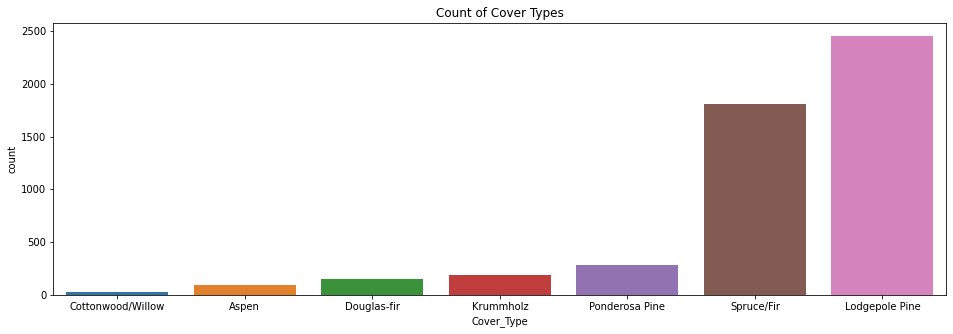

In [14]:
plt.figure(figsize=(16,5))
sns.countplot(x=X['Cover_Type'], order=['Cottonwood/Willow'
                         , 'Aspen', 'Douglas-fir', 'Krummholz','Ponderosa Pine', 'Spruce/Fir', 'Lodgepole Pine'])
plt.title('Count of Cover Types')
plt.show()

Creating column data types for one hot encodeing and scaling.

In [15]:
X = pd.get_dummies(X)

In [16]:
X.columns

Index(['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Roadways',
       'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
       'Horizontal_Distance_To_Fire_Points', 'Wilderness_Area1',
       'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4',
       'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5',
       'Soil_Type6', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10',
       'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',
       'Soil_Type15', 'Soil_Type16', 'Soil_Type17', 'Soil_Type18',
       'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22',
       'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26',
       'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30',
       'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34',
       'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38',
       'Soil_Type39', 'Soil_Type40', 'Distance_To_Hydrology',
       'Cover_Type_Aspen', 'Cover_Type_Cottonwood

In [17]:
num_cols = X[["Elevation","Aspect","Slope","Horizontal_Distance_To_Roadways","Hillshade_9am","Hillshade_Noon"
              ,"Hillshade_3pm","Horizontal_Distance_To_Fire_Points","Distance_To_Hydrology"]]

bin_cols = X[["Wilderness_Area1","Wilderness_Area2","Wilderness_Area3","Wilderness_Area4","Soil_Type1","Soil_Type2"
               ,"Soil_Type3","Soil_Type4","Soil_Type5","Soil_Type6","Soil_Type7","Soil_Type8","Soil_Type9","Soil_Type10"
               ,"Soil_Type11","Soil_Type12","Soil_Type13","Soil_Type14","Soil_Type15","Soil_Type16","Soil_Type17"
               ,"Soil_Type18","Soil_Type19","Soil_Type20","Soil_Type21","Soil_Type22","Soil_Type23","Soil_Type24"
               ,"Soil_Type25","Soil_Type26","Soil_Type27","Soil_Type28","Soil_Type29","Soil_Type30","Soil_Type31"
               ,"Soil_Type32","Soil_Type33","Soil_Type34","Soil_Type35","Soil_Type36","Soil_Type37","Soil_Type38"
               ,"Soil_Type39","Soil_Type40"]]

cat_cols = X[['Cover_Type_Aspen', 'Cover_Type_Cottonwood/Willow', 'Cover_Type_Douglas-fir', 'Cover_Type_Krummholz'
              , 'Cover_Type_Lodgepole Pine', 'Cover_Type_Ponderosa Pine', 'Cover_Type_Spruce/Fir']]

In [18]:
X.head(20)

,Elevation,Aspect,Slope,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,...,Soil_Type39,Soil_Type40,Distance_To_Hydrology,Cover_Type_Aspen,Cover_Type_Cottonwood/Willow,Cover_Type_Douglas-fir,Cover_Type_Krummholz,Cover_Type_Lodgepole Pine,Cover_Type_Ponderosa Pine,Cover_Type_Spruce/Fir
0,3207,69,4,1176,224,231,143,2222,0,0,...,0,0,845.312960,0,0,0,0,0,0,1
1,2618,246,18,1296,179,251,207,1518,0,0,...,0,0,30.016662,0,0,0,0,1,0,0
2,2789,12,15,30,203,207,139,752,0,0,...,0,0,253.049402,0,0,0,0,1,0,0
3,3170,39,9,1616,221,220,134,2618,0,0,...,0,0,726.371806,0,0,0,0,0,0,1
4,3262,358,6,4052,211,229,156,1803,1,0,...,0,0,0.000000,0,0,0,0,0,0,1
5,2213,114,42,503,250,163,0,459,0,0,...,0,0,407.155990,0,0,0,0,0,1,0
6,2927,81,5,960,226,231,140,2251,1,0,...,0,0,153.081678,0,0,0,0,1,0,0
7,2933,94,19,1683,246,208,84,1437,1,0,...,0,0,255.566038,0,0,0,0,1,0,0
8,3088,307,7,1020,201,236,175,1052,0,1,...,0,0,633.007109,0,0,0,0,1,0,0
9,3042,58,3,2068,222,233,147,1929,0,0,...,0,0,127.192767,0,0,0,0,1,0,0


In [19]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 60 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Elevation                           5000 non-null   int64  
 1   Aspect                              5000 non-null   int64  
 2   Slope                               5000 non-null   int64  
 3   Horizontal_Distance_To_Roadways     5000 non-null   int64  
 4   Hillshade_9am                       5000 non-null   int64  
 5   Hillshade_Noon                      5000 non-null   int64  
 6   Hillshade_3pm                       5000 non-null   int64  
 7   Horizontal_Distance_To_Fire_Points  5000 non-null   int64  
 8   Wilderness_Area1                    5000 non-null   int64  
 9   Wilderness_Area2                    5000 non-null   int64  
 10  Wilderness_Area3                    5000 non-null   int64  
 11  Wilderness_Area4                    5000 no

Doing PCA on data to reduce features.

In [20]:
# code will not run so come back later to fix. For now, I'll separate manually.
#preprocessing = ColumnTransformer([
#    ('encoder', OneHotEncoder(), cat_cols),
#    ('scale', StandardScaler(), num_cols)
#], remainder='passthrough')

In [21]:
#pipeline = Pipeline([
#    ('preprocessing', preprocessing),
#    ('pca', PCA(3)),
#])

In [22]:
# scaling numerical data then assigning names back to transformed columns

scaler = StandardScaler()
num_cols = pd.DataFrame(scaler.fit_transform(num_cols))

num_cols.columns = ["Elevation","Aspect","Slope","Horizontal_Distance_To_Roadways"
                 ,"Hillshade_9am","Hillshade_Noon","Hillshade_3pm"
                 ,"Horizontal_Distance_To_Fire_Points","Distance_To_Hydrology"]

In [23]:
# concatenating scaled numerical data with remaining binary variables

X = pd.concat([num_cols, cat_cols, bin_cols], axis=1, join='inner')
X.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Distance_To_Hydrology,Cover_Type_Aspen,...,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40
0,0.882432,-0.773163,-1.356176,-0.766628,0.454745,0.402644,0.008195,0.201120,2.679986,0,...,0,1,0,0,0,0,0,0,0,0
1,-1.220243,0.788712,0.512607,-0.689304,-1.213650,1.407244,1.671175,-0.349640,-1.134274,0,...,0,0,0,0,0,0,0,0,0,0
2,-0.609789,-1.276140,0.112154,-1.505081,-0.323839,-0.802877,-0.095741,-0.948905,-0.090843,0,...,0,0,0,0,0,0,0,0,0,0
3,0.750345,-1.037888,-0.688753,-0.483104,0.343519,-0.149886,-0.225661,0.510923,2.123535,0,...,0,1,0,0,0,0,0,0,0,0
4,1.078777,1.777017,-1.089207,1.086591,-0.027236,0.302184,0.345988,-0.126676,-1.274703,0,...,0,0,0,0,0,0,0,1,0,0


In [24]:
# creating a dice dissimilarity matrix for possible use later
# delete if not used

dice_dist = pdist(X, metric="dice")
dice_dist = squareform(dice_dist)
dice_dist.shape

(5000, 5000)

# PCA
We'll beging by reducing our data for K-Means/Medoids

In [26]:
# applying PCA to X

pca = PCA(3)
pcs = pca.fit_transform(X)
pcs = pd.DataFrame(pcs, columns=["pc1", "pc2", "pc3"], index=X.index)

In [27]:
# looking at our 3 components

loadings = pca.components_.T
loadings = pd.DataFrame(loadings, columns=pcs.columns, index=X.columns)
loadings.style.background_gradient(axis=1)

,pc1,pc2,pc3
Elevation,-0.092810,-0.417595,0.402361
Aspect,-0.494699,0.150908,0.055230
Slope,0.110963,0.467515,0.441334
Horizontal_Distance_To_Roadways,-0.133474,-0.415222,0.253025
Hillshade_9am,0.443926,-0.343801,-0.249145
Hillshade_Noon,-0.394038,-0.303767,-0.376104
Hillshade_3pm,-0.598455,0.050141,-0.059786
Horizontal_Distance_To_Fire_Points,0.028073,-0.345950,0.146442
Distance_To_Hydrology,-0.045824,-0.137525,0.568210
Cover_Type_Aspen,0.005460,0.006386,-0.006037


In [28]:
# 3 components of PCA explain 55% of data
np.sum(pca.explained_variance_ratio_)

0.5495370443687554

In [29]:
# Variance explained by each component (as a percentage)
pca.explained_variance_ratio_

array([0.23210018, 0.20253063, 0.11490623])

In [30]:
# Cumulative explained variance
np.cumsum(pca.explained_variance_ratio_)

array([0.23210018, 0.43463081, 0.54953704])

* pca1 is relatively low elevation, flat land that has shade at 9am and contains all tree types and somewhat close to landmarks.

* pca2 is relatively unlevel terrain likely west facing, the most untouch by humans and high in soil types 1-6. 

* pca3 is the highest terrain, closest to landmarks and strongest in only two types of trees with relatively higher amounts 
of soil types 22-40. 

### Plotting our 3 principle components

In [31]:
plot_df = pd.concat((pcs, X), axis=1)
plot_df = plot_df.reset_index()
px.scatter(
    data_frame=plot_df,
    x="pc1",
    y="pc2",
    color="pc3",
)

Looping through various K-Means clusters to see which clusters return high silouette scores. We'll focus on those for analysis.

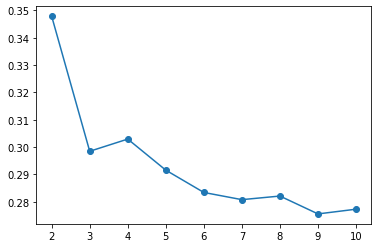

In [32]:
ks = range(2, 11)
scores = []

best_scoring_k = -1
for k in tqdm(ks):
    kmeans = KMeans(k)
    kmeans.fit(pcs)

    score = silhouette_score(pcs, kmeans.labels_)

    # Save k as best scoring k if
    # no scores yet or if score is highest yet
    if not scores or score > max(scores):
        best_scoring_k = k
    scores.append(score)

plt.plot(ks, scores, "o-")
plt.show()

In [33]:
print(f'K-means silhouette scores for 2 thru 10 clusters: {scores}')

K-means silhouette scores for 2 thru 8 clusters: [0.347806426479815, 0.29848174782905373, 0.3029396530968413, 0.2915843214646841, 0.2834364108417843, 0.28081133700449745, 0.28212836096951477, 0.2756008301778279, 0.2773246876822878]


# K-Means
The plot above indicates that k=2 has the best silhouette score with .35. However, I would like more clusters with more information and k=4 is not much worse at .30 so we'll build the model with 4 clusters for simplicity.

In [34]:
kmeans = KMeans(4)
kmeans.fit(pcs)

KMeans(n_clusters=4)

In [35]:
labels = pd.Series(kmeans.labels_)
label_counts = pd.concat(
    (labels.value_counts(normalize=True), labels.value_counts()), axis=1
)
label_counts.columns = ["percent of records", "count of records"]
label_counts.index.name = "cluster"
label_counts

,percent of records,count of records
cluster,,
3,0.4178,2089
0,0.2670,1335
2,0.2020,1010
1,0.1132,566


In [36]:
labeled_X = X.copy()
labeled_X["label"] = kmeans.labels_

clst_avgs = labeled_X.groupby("label").mean()
clst_avgs = clst_avgs.sort_values(clst_avgs.columns[0])
clst_avgs.style.background_gradient()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Distance_To_Hydrology,Cover_Type_Aspen,Cover_Type_Cottonwood/Willow,Cover_Type_Douglas-fir,Cover_Type_Krummholz,Cover_Type_Lodgepole Pine,Cover_Type_Ponderosa Pine,Cover_Type_Spruce/Fir,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40
label,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,-0.978940,1.260539,1.143946,-0.627588,-1.752817,-0.135066,1.202085,-0.614064,-0.260602,0.015901,0.017668,0.113074,0.007067,0.443463,0.231449,0.171378,0.121908,0.042403,0.542403,0.293286,0.017668,0.026502,0.028269,0.060071,0.012367,0.028269,0.000000,0.000000,0.000000,0.229682,0.010601,0.000000,0.083039,0.005300,0.000000,0.003534,0.015901,0.000000,0.000000,0.008834,0.001767,0.028269,0.028269,0.063604,0.000000,0.000000,0.001767,0.015901,0.081272,0.017668,0.040636,0.033569,0.136042,0.003534,0.000000,0.000000,0.000000,0.000000,0.015901,0.001767
2,-0.526950,-0.813685,0.851605,-0.641196,0.521518,-1.187559,-1.197799,-0.395436,-0.085291,0.042574,0.013861,0.062376,0.022772,0.496040,0.104950,0.257426,0.320792,0.021782,0.538614,0.118812,0.009901,0.025743,0.017822,0.031683,0.011881,0.017822,0.000000,0.000000,0.007921,0.114851,0.047525,0.024752,0.043564,0.001980,0.000000,0.000990,0.007921,0.000990,0.000000,0.014851,0.000000,0.030693,0.024752,0.062376,0.001980,0.000000,0.000990,0.001980,0.131683,0.084158,0.039604,0.036634,0.152475,0.000000,0.000000,0.000000,0.000000,0.006931,0.027723,0.017822
3,0.227209,-0.646487,-0.509773,0.233027,0.565422,0.159837,-0.308439,0.341921,-0.013773,0.011489,0.000479,0.008617,0.045955,0.506941,0.017712,0.408808,0.624701,0.046434,0.327429,0.001436,0.000000,0.011489,0.000000,0.007659,0.000000,0.000479,0.000000,0.001436,0.002872,0.011489,0.023935,0.085687,0.007659,0.000000,0.000000,0.006702,0.004787,0.004787,0.011967,0.023456,0.000479,0.067975,0.119196,0.022020,0.002872,0.011010,0.002393,0.000000,0.263284,0.061273,0.034945,0.090474,0.043083,0.002393,0.003351,0.000000,0.002393,0.031115,0.021063,0.016276
0,0.458172,1.092785,-0.331595,0.386539,-0.536183,0.705604,0.879196,0.024477,0.196566,0.012734,0.000000,0.003745,0.046442,0.480899,0.006742,0.449438,0.433708,0.065918,0.497378,0.002996,0.000000,0.002996,0.000749,0.012734,0.000000,0.002247,0.000000,0.000000,0.000000,0.004494,0.005993,0.044195,0.022472,0.000000,0.000000,0.005243,0.001498,0.002247,0.011985,0.011236,0.007491,0.079401,0.146816,0.029963,0.000000,0.007491,0.002247,0.000000,0.197004,0.032210,0.059176,0.137079,0.068165,0.002996,0.002996,0.000749,0.000000,0.044944,0.034457,0.018727


In [37]:
plot_df = pd.concat((pcs, labeled_X), axis=1)
plot_df["label"] = plot_df["label"].astype(str)
plot_df = plot_df.reset_index()
px.scatter(
    data_frame=plot_df,
    x="pc1",
    y="pc2",
    color="label",
    hover_data=plot_df.columns
)

### Results of K-Means with 4 clusters

Clusters 2 and 3 and 0 and 1 are well separated. It's difficult to discern if 1 and 2 is well separated or not as well as between 0 and 3. 

* Cluster 3 has the most records with 42% of the data. Somewhat high but lowest aspect and slope, close to landmarks, high shade,
* Cluster 2 has 26% of the data. Highest, closest to landmarks, highest midday shade,
* Cluster 0 has 19% of the data. Somewhat low, further from landmarks, high morning shade but lowest shade rest of the day
* Cluster 1 has 13% of the data. Lowest but highest aspect and slope., furthest from landmarks, highest pm shade, 


0 is high in Aspen and Cottonwood but low in Lodgepole
1 is high in Douglas and Ponderosa but low in Krummholz and Spruce
2 is high in Krummholz and Spruce but low in Aspen, Cottonwood and Ponderosa
3 is high in Lodgepole but low in Aspen, Cottonwood, Douglas and Ponderosa


1 is highest in wilderness area 3 lowest in 1
0 is highest in wilderness area 3 lowest in 2
3 is highest in wilderness area 1 lowest in 4
2 is highest in wilderness area 2 lowest in 4


0 and 1 high in soil types 1-6 and relatively lower in remaining soil types
3 lowest in soil types 1-7 but relatively higher in 16 - 40
2 lowest in soil types 1-11 but relatively higher in 19 - 40

# Hierarchical Cluster

Average - Middle ground; great place to start

Complete - Can give more disparate clusters (might end up making points that were originally close together appear in different clusters)

Single - Will be biased towards making a "mega" cluster and then adding in outliers 1 by 1

In [38]:
# creating a 2nd datafram of 5000 samples due to error message indicating not enough memory

Xdf = pd.DataFrame(np.array(df.sample(5000)))
Xdf.columns = df.columns

In [39]:
cluster_cols = [
      'Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology','Vertical_Distance_To_Hydrology'
    , 'Horizontal_Distance_To_Roadways','Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm'
    , 'Horizontal_Distance_To_Fire_Points'
]

Xdf = Xdf.dropna(subset=cluster_cols)
X_hier = Xdf[cluster_cols]
X_hier.head(2)

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points
0,2724,332,28,268,113,1819,144,192,180,2506
1,2269,194,22,170,89,1149,211,251,164,1153


In [40]:
X_hier.shape

(5000, 10)

In [41]:
scaler = StandardScaler()
scaled = scaler.fit_transform(X_hier)
scaled = pd.DataFrame(scaled, columns=X_hier.columns, index=X_hier.index)
scaled.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points
0,-0.832502,1.603129,1.804729,-0.017723,1.084348,-0.322304,-2.490562,-1.553928,0.975574,0.381441
1,-2.482177,0.363173,1.014602,-0.485184,0.684215,-0.749881,-0.043449,1.412812,0.566198,-0.628115
2,1.466167,0.363173,-0.302276,0.244627,-0.782941,-0.359318,0.212219,1.362528,0.566198,1.369358
3,-0.321284,-1.245177,-0.697340,-1.095744,-0.732925,0.291619,-0.006925,-0.095700,0.105650,0.283694
4,0.128298,1.387485,-0.829027,-0.337314,-0.699580,-0.384207,-0.518262,0.608272,0.898816,1.074624


In [42]:
# clst = AgglomerativeClustering(n_clusters=5, affinity="euclidean", linkage="ward") = .2609
# clst = AgglomerativeClustering(n_clusters=5, affinity="euclidean", linkage="average") = .3417
# clst = AgglomerativeClustering(n_clusters=5, affinity="euclidean", linkage="single") = .-1291
# clst = AgglomerativeClustering(n_clusters=4, affinity="euclidean", linkage="average") = .3768
# clst = AgglomerativeClustering(n_clusters=3, affinity="euclidean", linkage="average") = .4442
# clst = AgglomerativeClustering(n_clusters=5, affinity="euclidean", linkage="complete") = .3367
# clst = AgglomerativeClustering(n_clusters=4, affinity="euclidean", linkage="complete") = .3720
# clst = AgglomerativeClustering(n_clusters=3, affinity="euclidean", linkage="complete") = .4449

clst = AgglomerativeClustering(n_clusters=3, affinity="euclidean", linkage="complete")
clst.fit(scaled)

AgglomerativeClustering(linkage='complete', n_clusters=3)

In [43]:
labels = clst.fit_predict(X_hier)

In [44]:
print("The silhoutte score of the Agglomerative Clustering Ward Linkage: {}"
      .format(metrics.silhouette_score(X_hier, labels, metric='euclidean')))

The silhoutte score of the Agglomerative Clustering Ward Linkage: 0.40722043367303684


In [45]:
X_hier["label"] = clst.labels_
X_hier["label"] = "Cluster: " + X_hier["label"].astype(str)
X_hier["label"].value_counts()

C:\Users\Mike\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Mike\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Cluster: 1    3928
Cluster: 0     639
Cluster: 2     433
Name: label, dtype: int64

In [46]:
# grouping by cluster label for analysis

clst_avgs = X_hier.groupby("label").mean()
clst_avgs.style.background_gradient()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points
label,,,,,,,,,,
Cluster: 0,2974.472613,131.322379,11.909233,281.982786,35.433490,3598.799687,218.871674,225.777778,138.805947,4740.192488
Cluster: 1,2929.212576,156.407587,14.891039,265.802953,49.944501,1814.687373,211.130346,222.112271,141.823320,1564.040224
Cluster: 2,3144.189376,160.787529,12.413395,310.200924,48.452656,5063.466513,211.937644,225.836028,146.824480,1850.909931


Using agglomerative clustering above, using 3 clusters to represent the data returned optimal silhouette score of .4442

It appears that with 3 clusters:
* cluster 1 being the largest with 3929 records
* cluster 0 being the next with 639
* cluster 2 having the least with 433

Cluster 2 has the highest elevation and aspect and is closest to landmark. It also get most afternoon shade. 
Cluster 0 is the flatest of the cluster and medium distance to landmars and it get the most morning shade.
Cluster 1 has terrain that falls between the other 2 and slightly farthest from landmarks and get most shade in the afternoon. 

# DBSCAN

Since we are assuming unlabeled data, we can try a density model that may help reveal the optimal number of clusters to represent this data well. Based on the pairplot, we don't have really good linear separable data so DBSCAN may help us find better clusters of any shape which is insensitive to outliers. The main hyperparameters here are epsilon and min-samples.

In [47]:
# creating a 3nd datafram of 5000 samples to simplify plot

Xdf = pd.DataFrame(np.array(df.sample(5000)))
Xdf.columns = df.columns

In [48]:
cluster_cols = [
      'Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology','Vertical_Distance_To_Hydrology'
    , 'Horizontal_Distance_To_Roadways','Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm'
    , 'Horizontal_Distance_To_Fire_Points'
]

Xdf = Xdf.dropna(subset=cluster_cols)
X_DB = Xdf[cluster_cols]
X_DB.head(2)

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points
0,2807,348,9,182,9,690,203,225,161,481
1,2474,328,26,240,111,806,150,201,186,1443


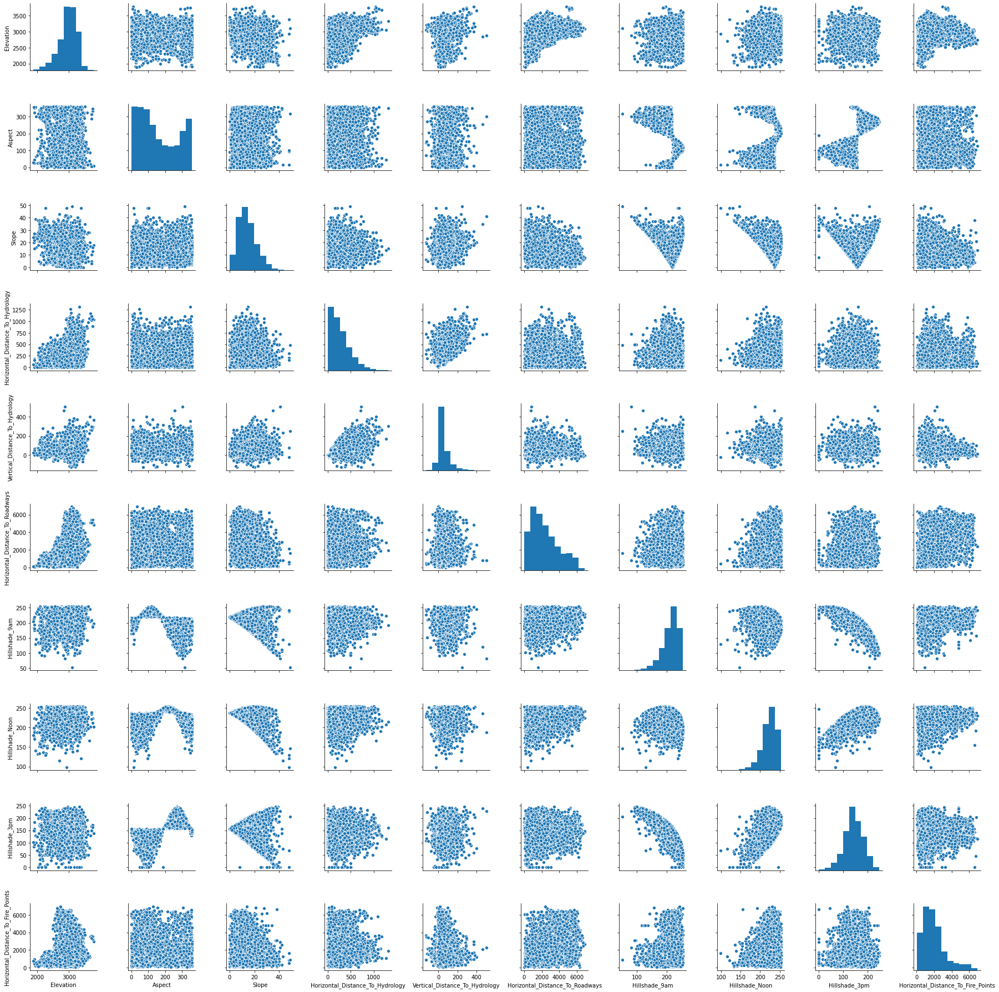

In [49]:
# pairplot reveals a lot of data that is nonlinearly separable
sns.pairplot(X_DB)
plt.show()

In [55]:
# (eps=1, metric="euclidean", min_samples=5) 93 cluster
# (eps=1, metric="euclidean", min_samples=2) 16 cluster, -.376
# (eps=.5, metric="euclidean", min_samples=5) 2 cluster, -.184
# (eps=.5, metric="euclidean", min_samples=3) 44 cluster
# (eps=.5, metric="euclidean", min_samples=4) 7 cluster,-.309
# (eps=.5, metric="euclidean", min_samples=7) 0 cluster, 
# (eps=.2, metric="euclidean", min_samples=5) 0 cluster
# (eps=.2, metric="euclidean", min_samples=2) 27 cluster, -.423

# (eps=.1, metric="euclidean", min_samples=1) 2 cluster, -.184
# (eps=.5, metric="euclidean", min_samples=3) 44 cluster
# (eps=.5, metric="euclidean", min_samples=4) 7 cluster,-.309
# (eps=.5, metric="euclidean", min_samples=7) 0 cluster, 
# (eps=.5, metric="euclidean", min_samples=7) 0 cluster, 
# (eps=.5, metric="euclidean", min_samples=7) 0 cluster, 

# using dice_dist from above
# (eps=.2, metric="precomputed", min_samples=2) 2464 cluster 
# (eps=1, metric="precomputed", min_samples=1) 2464
# (eps=5, metric="precomputed", min_samples=2) 0 cluster
# (eps=10, metric="precomputed", min_samples=2) 0 cluster

# (eps=1, metric="manhattan", min_samples=5) 1 cluster, -.019
# (eps=1.5, metric="manhattan", min_samples=5) 16 cluster, -.376
# (eps=2, metric="manhattan", min_samples=2) 691 cluster
# (eps=1.5, metric="manhattan", min_samples=2) 574 clusters
# (eps=1, metric="manhattan", min_samples=4) 3 cluster but low data not good inc or dec min samples
# (eps=1.5, metric="manhattan", min_samples=7) 1 cluster but low data not good going up or down min
# (eps=.5, metric="manhattan", min_samples=3) 1 cluster not good going up or down with min samples
# (eps=2, metric="manhattan", min_samples=10) 3 cluster -.299 but not good going up or down with min samples
# (eps=2, metric="manhattan", min_samples=8) 11 cluster, -.320
# (eps=3, metric="manhattan", min_samples=20) 6 cluster -.230 but not good going up or down
# (eps=3, metric="manhattan", min_samples=20) not good
# (eps=5, metric="manhattan", min_samples=5) 6 clusters, .009
# (eps=5, metric="manhattan", min_samples=5)
# (eps=6, metric="manhattan", min_samples=5) 1 cluster but not good going up or down
# (eps=6, metric="manhattan", min_samples=2) 3 clusters but imbalanced .118
# (eps=7, metric="manhattan", min_samples=1) 8 cluster but imbalanced .118 bad going up or down


dbscan = DBSCAN(eps=5, metric="manhattan", min_samples=5)
dbscan.fit(X)
core_samples_mask = np.zeros_like(dbscan.labels_, dtype=bool)
core_samples_mask[dbscan.core_sample_indices_] = True

Attempted numerous hyperparameters to no success. Model was attempted using a dice distance matrix as well as the original scaled data also to no success. More work should be done here but I'm moving on for now.

In [56]:
# adding cluster labels to labeled_df and printing number of clusters and outliers

X_DB["DB_clst_label"] = dbscan.labels_
X_DB["DB_clst_label"] = "Cluster: " + X_DB["DB_clst_label"].astype(str)
print(f'{X_DB["DB_clst_label"].nunique() - 1} Clusters')
print(f'{X_DB[X_DB["DB_clst_label"] == -1].shape[0]} Outliers')

C:\Users\Mike\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Mike\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



2 Clusters
0 Outliers


In [57]:
# how many records in each cluster

dbscan_clusters = X_DB[X_DB["DB_clst_label"] != "Cluster: -1"]
dbscan_clusters["DB_clst_label"].value_counts()

Cluster: 0    4852
Cluster: 1       4
Name: DB_clst_label, dtype: int64

In [58]:
# getting silhouette sccore to compare models

DB_labels = dbscan.labels_
print("Silhouette Coefficient: %0.3f"% metrics.silhouette_score(X, DB_labels))

Silhouette Coefficient: 0.204


In [59]:
clst_avgs = dbscan_clusters.groupby("DB_clst_label").mean()
clst_avgs.style.background_gradient()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points
DB_clst_label,,,,,,,,,,
Cluster: 0,2962.352020,157.314509,14.122012,268.976917,46.475474,2362.774732,212.068013,223.136439,142.383553,1987.033594
Cluster: 1,3155.750000,129.000000,9.000000,310.500000,27.500000,3009.250000,217.750000,229.250000,146.250000,1277.750000


Unable to find good clusters using DBSCAN after numerous attempts. See above. Moving onto t-SNE for feature reduction.

# t-SNE

To compare the dimensional reduction of PCA which better represent dissimilarity in the data, we can compare using t-SNE which better represents local similarities in the data. Such that two points that are close in high-D then they will be represented close in 1, 2 or 3D visualization. Based on the pairplot above, it appears that much of the data is nonlinear so t-SNE should visualize these similarities better than PCA. While the data here is cartographic and not image, audio or text, we can still explore the data using this method as long as we reduce the original dataset to a size more manageable by t-SNE such as 5000 random records. Again, we will not make inferences from the plots but mainly to explore the data and compare it to PCA above. 

The perplexity is a hyperparameter related to the number of nearest neighbors.

In [5]:
# creating a 3nd datafram of 5000 samples to simplify plot

tsne_df = pd.DataFrame(np.array(df.sample(5000)))
tsne_df.columns = df.columns

In [7]:
X = tsne_df.select_dtypes('number')

scaler = StandardScaler()
tsne_scaled = scaler.fit_transform(X)

tsne_scaled = pd.DataFrame(tsne_scaled, index=tsne_df.index, columns=tsne_df.columns)
tsne_scaled.head(2)

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,-1.736076,1.788316,1.202949,-0.95328,-0.629372,-0.754434,-1.397555,-1.532068,0.212289,-0.243437,...,-0.318311,-0.298872,-0.054855,-0.063372,-0.014144,-0.028296,-0.162737,-0.164669,-0.128323,2.677268
1,0.341663,-0.364065,-0.415658,-0.15732,-0.510995,0.538282,1.043603,0.287898,-0.639572,-1.079195,...,-0.318311,-0.298872,-0.054855,-0.063372,-0.014144,-0.028296,-0.162737,-0.164669,-0.128323,-0.068648


In [15]:
tsne = TSNE(2, perplexity=30)
X_tsne = tsne.fit_transform(tsne_scaled)

X_tsne = pd.DataFrame(X_tsne, index=tsne_df.index, columns=['tsne1', 'tsne2'])
X_tsne['Cover_Type'] = df['Cover_Type']
X_tsne = X_tsne.reset_index()
X_tsne.head()

,index,tsne1,tsne2,Cover_Type
0,0,18.844337,22.644903,5
1,1,-1.610562,-2.682819,5
2,2,-9.755523,48.248184,2
3,3,16.457077,57.884811,2
4,4,66.002640,-24.281195,5


In [9]:
# plot using perplexity=30
px.scatter(X_tsne, 'tsne1','tsne2',color='Cover_Type')

In [16]:
tsne = TSNE(2, perplexity=40)
X_tsne = tsne.fit_transform(tsne_scaled)

X_tsne = pd.DataFrame(X_tsne, index=tsne_df.index, columns=['tsne1', 'tsne2'])
X_tsne['Cover_Type'] = df['Cover_Type']
X_tsne = X_tsne.reset_index()
X_tsne.head()

,index,tsne1,tsne2,Cover_Type
0,0,59.597000,4.691638,5
1,1,24.051600,-19.729525,5
2,2,-32.588863,54.173267,2
3,3,39.480167,29.995674,2
4,4,-5.856908,55.307384,5


In [12]:
# plot using perplexity=40
px.scatter(X_tsne, 'tsne1','tsne2',color='Cover_Type')

In [17]:
tsne = TSNE(2, perplexity=20)
X_tsne = tsne.fit_transform(tsne_scaled)

X_tsne = pd.DataFrame(X_tsne, index=tsne_df.index, columns=['tsne1', 'tsne2'])
X_tsne['Cover_Type'] = df['Cover_Type']
X_tsne = X_tsne.reset_index()
X_tsne.head()

,index,tsne1,tsne2,Cover_Type
0,0,-31.183331,82.522064,5
1,1,32.120697,39.846455,5
2,2,41.551598,-15.004308,2
3,3,14.154493,-66.775490,2
4,4,1.693795,77.472198,5


In [14]:
# plot using perplexity=20
px.scatter(X_tsne, 'tsne1','tsne2',color='Cover_Type')

T-SNE clearly maximizes the local similarities in the data by revealing clear clusters which increase in distance with increasing perplexity. With highest perplexity, the data clusters more strongly in either of the components. With low perplexity, we see larger clusters developing with equal numbers of both components. 

# Results

PCA components were used for K-Means below.
* pca1 is relatively low elevation, flat land that has shade at 9am and contains all tree types and somewhat close to landmarks.

* pca2 is relatively unlevel terrain likely west facing, the most untouch by humans and high in soil types 1-6. 

* pca3 is the highest terrain, closest to landmarks and strongest in only two types of trees with relatively higher amounts 
of soil types 22-40. 


K-Means best silhouette score indicated 2 clusters would be best but I opted for 4 for more information at little cost in accuracy. K-means clusters were more balanced overall than Hierarchical clustering but had lower silhouette scores. I chose to go with 4 clusters using K-Means with a silhouette score of 0.3029. I will compare them to the 3 clusters from hierarchical clustering that had the highest silhouette score of 0.4442. The 3 hierarchical clusters where more imbalanced compared to K-means.  


Comparing the biggest clusters from K-means and hierarchical clustering, both are quite similar with medium terrain and high shade in the afternoon but medium distance to landmarks.


Comparing the smallest clusters in each model, each were exactly the opposite except both getting the most afternoon shade.


I had hoped to compare 3 clustering models but I was unable to tune DBSCAN to find any useful clusters. Will need to work more on tuning it or perhaps getting my code to pass the dice distance matrix to the model which I was unable to do as well.


Comparing both PCA and t-SNE on purely a visual basis, I think t-SNE was more useful than PCA especially if used to predict forest cover type since clusters were clearly separated compared to the PCA plot. PCA produced clear separation between only two of the 4 clusters but decently separated the remaining 3. Both produced cluster than appeared equally dense but t-SNE clusters were more symmetrical. 


TSNE would help to reduce dimensions of a supervised model to predict the cover type of the 7 regions in Roosevelt National Forest. Reducing the data to 2 components may provide some predictive power since clusters are well separated and cluster sizes appear to grow with less perplexity. This comes at a cost of not clearly knowing how much of each component is in the cluster since clusters at the center comprise more equal amounts of both components. Clusters at the margins indicate components well but don't necessarily help with predicting cover type since clusters are smaller. 